<p align="center" width="100%">
    <img width="66%" src="https://raw.githubusercontent.com/linukc/master_dlcourse/main/images/logo.png">
</p>

 # **[MIPT DL frameworks Spring 2024](https://wiki.cogmodel.mipt.ru/s/mtai/doc/2024-nejrosetevye-frejmvorki-glubokogo-obucheniya-ZBGd69bxLd). Class 1: Neural Networks Training, p.2**

## **Goals**

In this assignment, you will practice coding an gradient descent and it successors.

## **Setup**

In [ ]:
!python3 --version

Python 3.10.12


In [ ]:
!python -m pip list | grep numpy

numpy                            1.23.5


In [ ]:
!python -m pip list | grep torch

torch                            2.1.0+cu121
torchaudio                       2.1.0+cu121
torchdata                        0.7.0
torchsummary                     1.5.1
torchtext                        0.16.0
torchvision                      0.16.0+cu121


In [ ]:
import math
import numpy as np
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

## **Optimizers**

Тестовые функции для оптимизаций ([EN](https://en.wikipedia.org/wiki/Test_functions_for_optimization), [RU](https://ru.wikipedia.org/wiki/%D0%A2%D0%B5%D1%81%D1%82%D0%BE%D0%B2%D1%8B%D0%B5_%D1%84%D1%83%D0%BD%D0%BA%D1%86%D0%B8%D0%B8_%D0%B4%D0%BB%D1%8F_%D0%BE%D0%BF%D1%82%D0%B8%D0%BC%D0%B8%D0%B7%D0%B0%D1%86%D0%B8%D0%B8))

In [ ]:
class SaddleTest:
  x_space = np.linspace(-5, 5, 100)
  y_space = np.linspace(-5, 5, 100)

  start_x = 5
  start_y = 0

  colorscale = 'Viridis'

  @classmethod
  def surface_function(cls, x, y):
    return x**2 - y**2

  @classmethod
  def grad_x(cls, x, y):
    return 2*x

  @classmethod
  def grad_y(cls, x, y):
    return -2*y

In [ ]:
class Bukin6Test:
  """
  f(-10, 1) = 0
  """
  x_space = np.linspace(-15, -5, 100)
  y_space = np.linspace(-4, 6, 100)

  start_x = -14
  start_y = 5

  colorscale = 'Viridis'

  @classmethod
  def surface_function(cls, x, y):
    return 100 * np.sqrt(np.abs(y - 0.01 * x**2)) + 0.01 * np.abs(x + 10)

  @classmethod
  def grad_x(cls, x, y):
    df_dx = 0
    if x + 10 > 0:
      df_dx += 0.01
    else:
      df_dx -= 0.01

    if y - 0.01*x**2 > 0:
      df_dx += (0 - 0.02 * x) / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    else:
      df_dx += (0 - 0.02 * x) / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    return df_dx

  @classmethod
  def grad_y(cls, x, y):
    df_dy = 0
    if y - 0.01*x**2 > 0:
      df_dy = 100 / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    else:
      df_dy = -100 / (2 * np.sqrt(np.abs(y - 0.01 * x**2)))
    return df_dy

In [ ]:
class RosenbrockTest:
  """
  f(1, 1) = 0
  """
  x_space = np.linspace(-2, 2, 250)
  y_space = np.linspace(-1, 3, 250)
  minimum = (1.0, 1.0)

  start_x = -2
  start_y = 1

  @classmethod
  def surface_function(cls, x, y):
    return (1 - x) ** 2 + 100 * (y - x**2) ** 2

  @classmethod
  def grad_x(cls, x, y):
    return -2 * (1 - x) - 400 * x * (y - x**2)

  @classmethod
  def grad_y(cls, x, y):
    return 200 * (y - x**2)

In [ ]:
class RastriginTest:
  x_space = np.linspace(-5, 5, 100)
  y_space = np.linspace(-5, 5, 100)

  start_x = -2.0
  start_y = 3.5

  colorscale = 'Viridis'

  @classmethod
  def surface_function(cls, x, y):
    A = 10
    return A*2 + (x**2 - A * np.cos(2 * np.pi * x)) + (y**2 - A * np.cos(2 * np.pi * y))

  @classmethod
  def grad_x(cls, x, y):
    A = 10
    return 2*x + 2*np.pi*A*np.sin(2*np.pi*x)

  @classmethod
  def grad_y(cls, x, y):
    A = 10
    return 2*y + 2*np.pi*A*np.sin(2*np.pi*y)

In [ ]:
def visualize_descent_plotly(test_cls, path):
  """
  paths - list of tuples (float x, float y)
  """

  x_grid, y_grid = np.meshgrid(test_cls.x_space, test_cls.y_space)
  z_grid = test_cls.surface_function(x_grid, y_grid)
  x_values, y_values = path[:, 0], path[:, 1]
  z_values = test_cls.surface_function(x_values, y_values)

  # Создание фигуры с сеткой подграфиков: 1 ряд, 2 колонки
  fig = make_subplots(rows=1, cols=2,
          specs=[[{'type': 'surface'}, {'type': 'xy'}]],
          subplot_titles=('3D Visualization', '2D Contour Projection'))

  # Добавление 3D поверхности на подграфик (1, 1)
  fig.add_trace(go.Surface(x=x_grid, y=y_grid, z=z_grid, colorscale=test_cls.colorscale), row=1, col=1)

  # Добавление 3D линии градиентного спуска
  fig.add_trace(go.Scatter3d(x=x_values, y=y_values, z=z_values, mode='markers+lines',
                            marker=dict(size=5), line=dict(width=1)), row=1, col=1)

  # Добавление 2D контурного графика на подграфик (1, 2)
  fig.add_trace(go.Contour(x=test_cls.x_space, y=test_cls.y_space, z=z_grid,
                           colorscale=test_cls.colorscale, line_width=2), row=1, col=2)
  # Добавление 2D линии градиентного спуска
  fig.add_trace(go.Scatter(x=x_values, y=y_values, mode='markers+lines', marker=dict(size=5),
                          line=dict(width=1), line_color="red"), row=1, col=2)

  # Обновление макета для подграфиков
  fig.update_layout(title='Optimization Visualization',
                    autosize=True,
                    showlegend=False)
  # Показать графики
  fig.show()

In [ ]:
def visualize_descent_matplotlib(test_cls, path):
  """
  paths - list of tuples (float x, float y)
  """

  X, Y = np.meshgrid(test_cls.x_space, test_cls.y_space)
  Z = test_cls.surface_function(X, Y)

  iter_x, iter_y = path[:, 0], path[:, 1]

  fig = plt.figure(figsize=(8, 8))

  ax = fig.add_subplot(1, 1, 1)
  ax.contour(X, Y, Z, 90, cmap="jet")
  ax.plot(iter_x, iter_y, color="r", marker="x")

  ax.set_title(
      "Rosenbrock func"
  )
  plt.plot(*test_cls.minimum, "gD")
  plt.plot(iter_x[-1], iter_y[-1], "rD")

In [ ]:
def gradient_descent(test_cls, optimizer, num_iterations):
    x, y = test_cls.start_x, test_cls.start_y
    path = [(x, y)]
    for i in range(num_iterations):
        dx = test_cls.grad_x(x, y)
        dy = test_cls.grad_y(x, y)
        x, y = optimizer.step(x, dx, y, dy)

        if (not (test_cls.x_space[0] <= x <= test_cls.x_space[-1]) or
           not (test_cls.y_space[0] <= y <= test_cls.y_space[-1])):
          print(f"Achieve {test_cls.__name__} bounds - stop descent on iteration {i}")
          break
        path.append((x, y))
    return np.array(path)

### Vanilla SGD

* Description: The simplest form of SGD updates model parameters using the gradient of the loss with respect to the parameters for a single training example or a mini-batch.
* Limitations: Slow convergence, especially in the presence of saddle points or when the gradient is very small (vanishing gradient problem).

In [ ]:
class SGD:
  def __init__(self, learning_rate):
    self.learning_rate = learning_rate

  def step(self, x, dx, y, dy):
    x, y = x - self.learning_rate * dx, y - self.learning_rate * dy
    return x, y

In [ ]:
optimizer = SGD(learning_rate=0.1)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=50)
visualize_descent_plotly(SaddleTest, path)

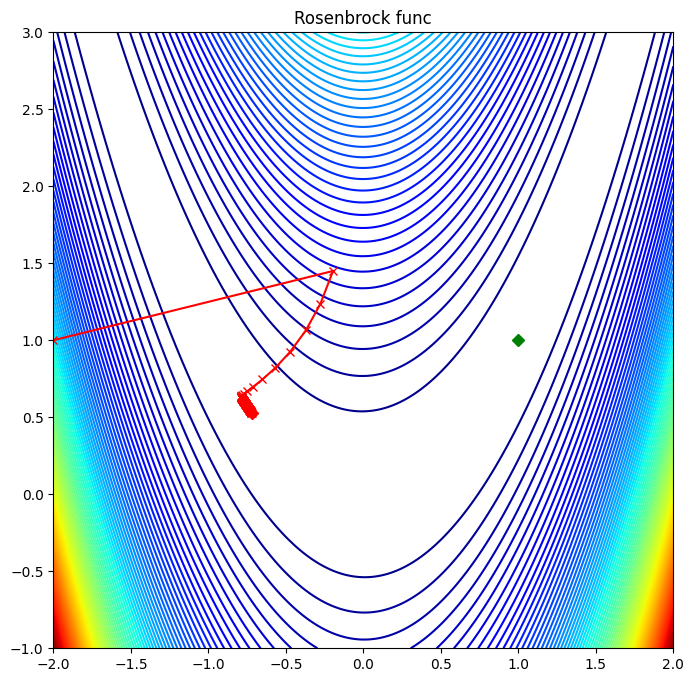

In [ ]:
optimizer = SGD(learning_rate=0.00075)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_matplotlib(RosenbrockTest, path)

In [ ]:
optimizer = SGD(learning_rate=0.001)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(Bukin6Test, path)

In [ ]:
optimizer = SGD(learning_rate=0.001)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(RastriginTest, path)

### Momentum SGD

* Description: Incorporates a momentum term in the update rule, which helps accelerate SGD in the relevant direction and dampens oscillations. It does this by adding a fraction of the previous update vector to the current update.
* Benefits: Faster convergence and reduced oscillation.

"The momentum term increases for dimensions whose gradients point in the same directions and reduces updates for dimensions whose gradients change directions. As a result, we gain faster convergence and reduced oscillation."

In [ ]:
class MomentumSGD:
  def __init__(self, learning_rate, momentum_rate):
    self.learning_rate = learning_rate
    self.momentum_rate = momentum_rate

    self.momentum_ema_x = 0
    self.momentum_ema_y = 0

  def step(self, x, dx, y, dy):
    self.momentum_ema_x = (self.momentum_ema_x * self.momentum_rate +
        (1 - self.momentum_rate) * dx)
    self.momentum_ema_y = (self.momentum_ema_y * self.momentum_rate +
        (1 - self.momentum_rate) * dy)

    x = x - self.learning_rate * self.momentum_ema_x
    y = y - self.learning_rate * self.momentum_ema_y
    return x, y

In [ ]:
optimizer = MomentumSGD(learning_rate=0.1, momentum_rate=0.9)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=50)
visualize_descent_plotly(SaddleTest, path)

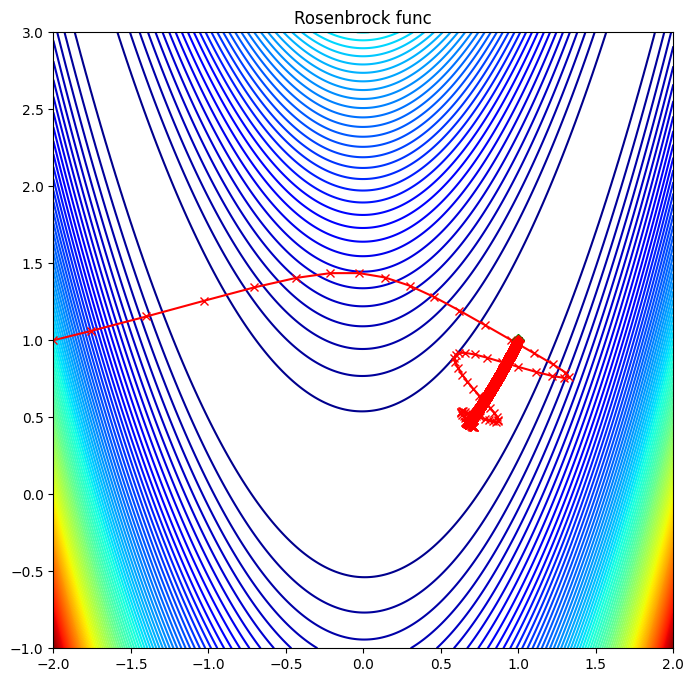

In [ ]:
optimizer = MomentumSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [ ]:
optimizer = MomentumSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(Bukin6Test, path)

In [ ]:
optimizer = MomentumSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

### Nesterov Accelerated Gradient (NAG)

* Description: A variation of Momentum SGD that calculates the gradient of the loss at a point slightly ahead in the direction of the momentum, instead of the current position.
* Benefits: Can lead to faster convergence compared to traditional momentum

"Nesterov momentum is a simple change to normal momentum. Here the gradient term is not computed from the current position θ(t) in parameter space but instead from a position θ(intermediate)=θ(t)+μv(t). This helps because while the gradient term always points in the right direction , the momentum term may not. If the momentum term points in the wrong direction or overshoots, the gradient can still "go back" and correct it in the same update step."

In [ ]:
def gradient_descent_with_nesterov_momentum(test_cls, optimizer, num_iterations):
    x, y = test_cls.start_x, test_cls.start_y
    path = [(x, y)]
    for i in range(num_iterations):
        x, y = optimizer.step(x, test_cls.grad_x, y, test_cls.grad_y)

        if (not (test_cls.x_space[0] <= x <= test_cls.x_space[-1]) or
           not (test_cls.y_space[0] <= y <= test_cls.y_space[-1])):
          print(f"Achieve {test_cls.__name__} bounds - stop descent on iteration {i}")
          break
        path.append((x, y))
    return np.array(path)

In [ ]:
class NesterovSGD:
  def __init__(self, learning_rate, momentum_rate):
    self.learning_rate = learning_rate
    self.momentum_rate = momentum_rate

    self.momentum_x = 0
    self.momentum_y = 0

  def step(self, x, dx_func, y, dy_func):
    ### look ahead from momentum term
    x_ahead = x + self.momentum_rate * self.momentum_x
    y_ahead = y + self.momentum_rate * self.momentum_y

    self.momentum_x = (self.momentum_x * self.momentum_rate -
        self.learning_rate * dx_func(x_ahead, y_ahead))
    self.momentum_y = (self.momentum_y * self.momentum_rate -
        self.learning_rate * dy_func(x_ahead, y_ahead))

    x = x + self.momentum_x
    y = y + self.momentum_y
    return x, y

In [ ]:
optimizer = NesterovSGD(learning_rate=0.1, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

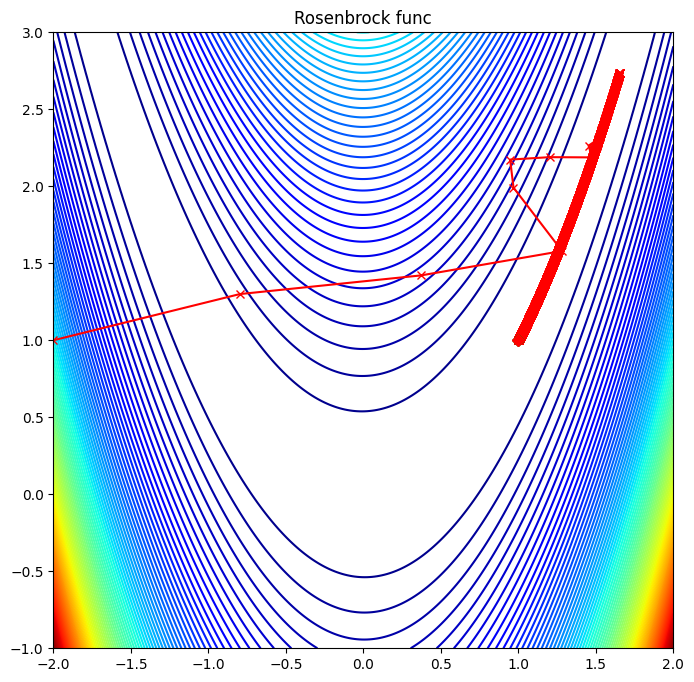

In [ ]:
optimizer = NesterovSGD(learning_rate=0.0005, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

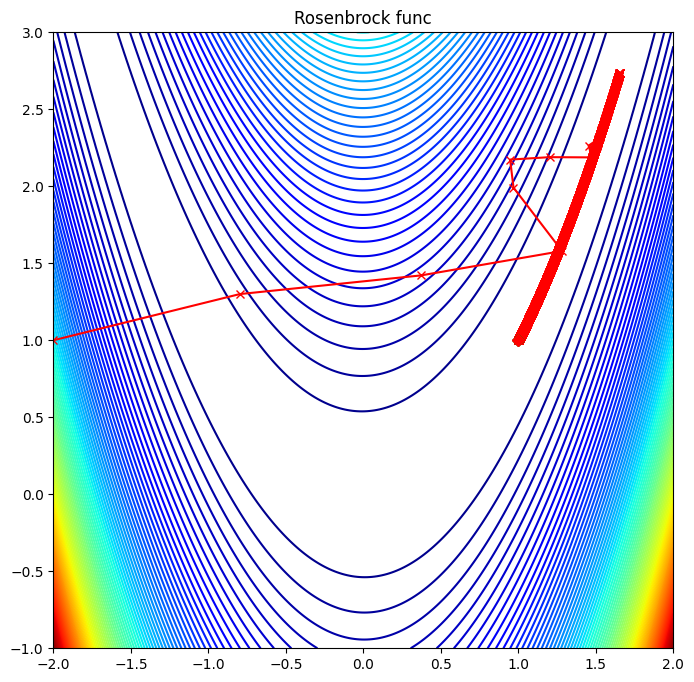

In [ ]:
optimizer = NesterovSGD(learning_rate=0.0005, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

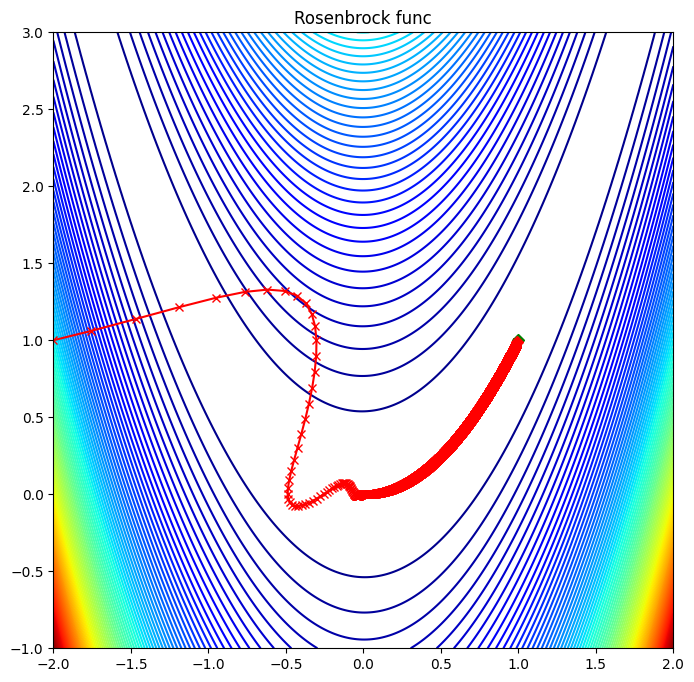

In [ ]:
optimizer = NesterovSGD(learning_rate=0.0001, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [ ]:
optimizer = NesterovSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(Bukin6Test, path)

Achieve Bukin6Test bounds - stop descent on iteration 251


In [ ]:
optimizer = NesterovSGD(learning_rate=0.001, momentum_rate=0.9)
path = gradient_descent_with_nesterov_momentum(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

https://towardsdatascience.com/is-pytorchs-nesterov-momentum-implementation-wrong-5dc5f5032008

### Adagrad

* Description: Adapts the learning rate for each parameter, allowing for larger updates for infrequent parameters and smaller updates for frequent ones. It accumulates the square of past gradients in the denominator.
* Benefits: Useful for sparse data. Removes the need to manually tune the learning rate.
* Limitations: The continuously accumulating denominator can cause the learning rate to shrink and become infinitesimally small, effectively stopping the model from learning further.

In [ ]:
class Adagrad:
  def __init__(self, learning_rate):
    self.learning_rate = learning_rate
    self.cache_x = 0
    self.cache_y = 0
    self.eps = 1e-8

  def step(self, x, dx, y, dy):
    self.cache_x += dx ** 2
    self.cache_y += dy ** 2

    x = x - (self.learning_rate / (math.sqrt(self.cache_x) + self.eps)) * dx
    y = y - (self.learning_rate / (math.sqrt(self.cache_y) + self.eps)) * dy
    return x, y

In [ ]:
optimizer = Adagrad(learning_rate=0.1)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

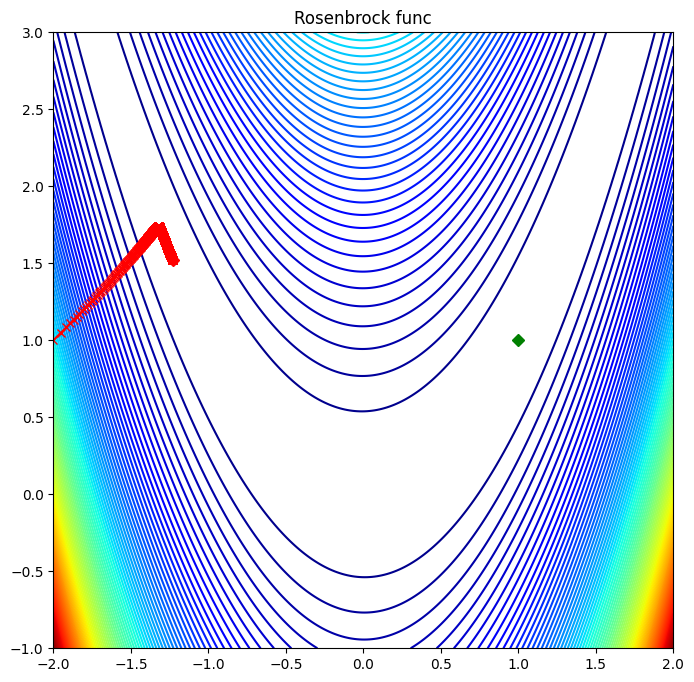

In [ ]:
optimizer = Adagrad(learning_rate=0.05)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [ ]:
optimizer = Adagrad(learning_rate=0.01)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(Bukin6Test, path)

In [ ]:
optimizer = Adagrad(learning_rate=0.01)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

### RMSProp (Root Mean Square Propagation)

* Description: Addresses the diminishing learning rates of Adagrad by using a moving average of squared gradients in the denominator, keeping the learning rate in a reasonable range.
* Benefits: Overcomes the radically diminishing learning rates of Adagrad.

In [ ]:
class RMSProp:
  def __init__(self, learning_rate, beta):
    self.learning_rate = learning_rate
    self.beta = beta
    self.cache_x_ema = 0
    self.cache_y_ema = 0
    self.eps = 1e-8

  def step(self, x, dx, y, dy):
    self.cache_x_ema = self.beta * self.cache_x_ema + (1 - self.beta) * dx ** 2
    self.cache_y_ema = self.beta * self.cache_y_ema + (1 - self.beta) * dy ** 2

    x = x - (self.learning_rate / (math.sqrt(self.cache_x_ema) + self.eps)) * dx
    y = y - (self.learning_rate / (math.sqrt(self.cache_y_ema) + self.eps)) * dy
    return x, y

In [ ]:
optimizer = RMSProp(learning_rate=0.1, beta=0.99)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

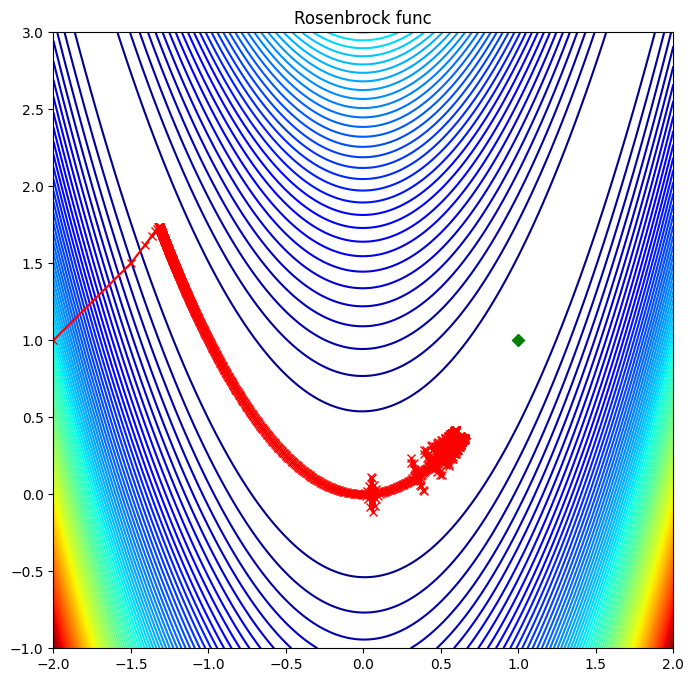

In [ ]:
optimizer = RMSProp(learning_rate=0.05, beta=0.99)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [ ]:
optimizer = RMSProp(learning_rate=0.01, beta=0.99)
path = gradient_descent(
          test_cls=Bukin6Test,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(Bukin6Test, path)

Achieve Bukin6Test bounds - stop descent on iteration 27


In [ ]:
optimizer = RMSProp(learning_rate=0.01, beta=0.99)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=1000)
visualize_descent_plotly(RastriginTest, path)

### Adam (Adaptive Moment Estimation)

* Description: Combines the ideas of momentum and RMSprop, maintaining a moving average of both gradients and squared gradients. It adjusts the learning rate for each parameter based on these moments.
* Benefits: Often performs well in practice and is robust to the choice of hyperparameters.

In [ ]:
class Adam:
  def __init__(self, learning_rate, momentum_rate, beta):
    self.learning_rate = learning_rate
    self.beta = beta
    self.momentum_rate = momentum_rate

    self.momentum_epa_x = 0
    self.momentum_epa_y = 0

    self.cache_x_ema = 0
    self.cache_y_ema = 0
    self.eps = 1e-8
    self.counter = 1

  def step(self, x, dx, y, dy):
    self.momentum_epa_x = (self.momentum_epa_x * self.momentum_rate +
        (1 - self.momentum_rate) * dx)
    self.momentum_epa_y = (self.momentum_epa_y * self.momentum_rate +
        (1 - self.momentum_rate) * dy)

    self.cache_x_ema = self.beta * self.cache_x_ema + (1 - self.beta) * dx ** 2
    self.cache_y_ema = self.beta * self.cache_y_ema + (1 - self.beta) * dy ** 2

    self.momentum_epa_x_correction = self.momentum_epa_x / (1 - self.momentum_rate ** self.counter)
    self.momentum_epa_y_correction = self.momentum_epa_y / (1 - self.momentum_rate ** self.counter)
    self.cache_x_ema_correction = self.cache_x_ema / (1 - self.beta ** self.counter)
    self.cache_y_ema_correction = self.cache_y_ema / (1 - self.beta ** self.counter)

    x = x - (self.learning_rate / (math.sqrt(self.cache_x_ema_correction)
      + self.eps)) * self.momentum_ema_x_correction
    y = y - (self.learning_rate / (math.sqrt(self.cache_y_ema_correction)
      + self.eps)) * self.momentum_ema_y_correction

    self.counter += 1
    return x, y

In [ ]:
optimizer = Adam(learning_rate=0.1, momentum_rate=0.9, beta=0.99)
path = gradient_descent(
          test_cls=SaddleTest,
          optimizer=optimizer,
          num_iterations=100)
visualize_descent_plotly(SaddleTest, path)

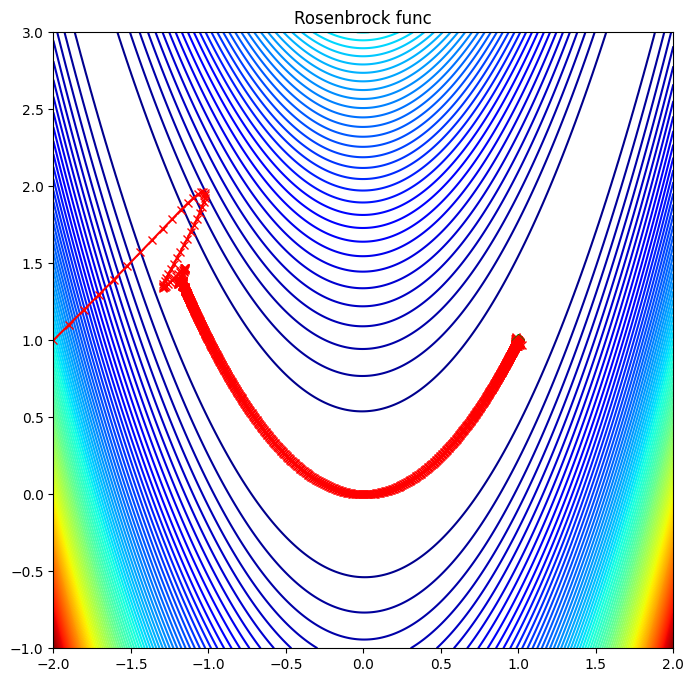

In [ ]:
optimizer = Adam(learning_rate=0.1, momentum_rate=0.9, beta=0.99)
path = gradient_descent(
          test_cls=RosenbrockTest,
          optimizer=optimizer,
          num_iterations=10000)
visualize_descent_matplotlib(RosenbrockTest, path)

In [ ]:
optimizer = Adam(learning_rate=0.01, momentum_rate=0.9, beta=0.99)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=10_000)
visualize_descent_plotly(RastriginTest, path)

### Others

https://github.com/jettify/pytorch-optimizer?tab=readme-ov-file#adamp

https://github.com/lucidrains/lion-pytorch

https://github.com/kakaobrain/torchlars

https://residentmario.github.io/pytorch-training-performance-guide/lr-sched-and-optim.html

https://pytorch.org/docs/stable/optim.html#module-torch.optim.lr_scheduler

## Homework

In [ ]:
optimizer = #Your_Optimizer(...)
path = gradient_descent(
          test_cls=RastriginTest,
          optimizer=optimizer,
          num_iterations=...)
visualize_descent_plotly(RastriginTest, path)
visualize_descent_plotly(Bukin6Test, path)

SyntaxError: invalid syntax (<ipython-input-464-fb0166c6f67f>, line 1)